# Environment

In [12]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [20]:
%%bash
pip install .

Processing /Users/dwynne891/Documents/Options/optionlib
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Created wheel for optionlib: filename=optionlib-0.1.0-py3-none-any.whl size=12910 sha256=006f09045a5c5aa28611613e545a99dc167147e3648a5b50809c7346f1988d22
  Stored in directory: /private/var/folders/5p/b_k1m3qs09q0s_768gjrmvvh0000gp/T/pip-ephem-wheel-cache-yrt7c1ax/wheels/4d/62/1f/11cc5573a52206189c39d7fffa7bb24e2fafc7df16a30a71e1
Successfully built optionlib
  Attempting uninstall: optionlib
    Found existing installation: optionlib 0.1.0
    Uninstalling optionlib-0.1.0:
      Successfully uninstalled optionlib-0.1.0


In [37]:
from optionlib import *

In [36]:
from plotly import express as px
import pandas as pd
import numpy as np
from tqdm import tqdm
from sklearn.ensemble import GradientBoostingRegressor
from joblib import Parallel, delayed
from scipy.stats import norm
from IPython.display import clear_output

# Data

## Ticker
SPX: %5ESPX

In [38]:
data = optionlib.data.ticker.base_data(risk_ticker='%5ESPX')

In [39]:
data.tail()

,Open,High,Low,Close,Adj Close,Volume,Volume_7d,pct_delta_1d,pct_delta_2d,pct_delta_3d,...,pct_delta_90d,pct_delta_180d,pct_delta_360d,hv30,shiller_pe,T10Y2Y,DGS10,VIX,jobs_friday,month
Date,,,,,,,,,,,,,,,,,,,,,
2024-01-25,4886.660156,4898.149902,4869.339844,4894.160156,4894.160156,4020430000,4.113667e+09,0.005260,0.006077,0.009016,...,0.099732,0.182701,0.142497,0.404492,31.56,-0.14,4.14,13.45,0.0,1
2024-01-26,4888.910156,4906.689941,4881.470215,4890.970215,4890.970215,3353400000,4.031496e+09,-0.000652,0.004605,0.005421,...,0.098223,0.187368,0.156673,0.403999,31.56,-0.19,4.15,13.26,0.0,1
2024-01-29,4892.950195,4929.310059,4887.399902,4927.930176,4927.930176,3525160000,3.960947e+09,0.007557,0.006900,0.012197,...,0.108908,0.191000,0.190899,0.366364,31.56,-0.21,4.08,13.60,0.0,1
2024-01-30,4925.890137,4931.089844,4916.270020,4924.970215,4924.970215,3836130000,3.896509e+09,-0.000601,0.006952,0.006295,...,0.118752,0.192308,0.192854,0.367417,31.56,-0.30,4.06,13.31,0.0,1
2024-01-31,4899.189941,4906.750000,4845.149902,4845.649902,4845.649902,4696120000,3.953439e+09,-0.016106,-0.016697,-0.009266,...,0.119088,0.174965,0.170229,0.469815,32.61,-0.28,4.06,14.35,0.0,1


## Earnings

stock = 'TSLA'
earnings = earnings.earnings_data(stock)

earnings.head()

## Option prices
SPX: %5ESPX

In [12]:
# prices_df = prices.yahoo_option_prices('SPY','2024-01-12')
prices_df = prices.fidelity_option_prices()

Did you update the html file?


/Users/dwynne891/opt/anaconda3/lib/python3.9/site-packages/optionlib/data/prices.py:35: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  df = pd.read_html(str(table))[0]


In [65]:
from bs4 import BeautifulSoup
from io import StringIO

from numpy import floor

In [66]:
file_path = '../Option Chain_ Fidelity Investments.html'

def rounded_midpoint(bid,ask,base):
    return floor(round((bid+ask)/2,2)/base)*base

with open(file_path,'r', encoding='utf-8', errors='ignore') as fp:
    soup = BeautifulSoup(fp, 'html.parser')
    
table = soup.find_all('table')
df = pd.read_html(StringIO(str(table)))[0]

prices = df.set_index('Strike').filter(regex = '^\d',axis = 0).filter(regex = 'Bid|Ask|Vol')
prices.index = prices.index.astype(float)
prices = pd.concat([
    prices.assign(
        put_call = 'C'
    ).set_index('put_call',append=True)[['Bid','Ask','Imp Vol']],
    prices.assign(
        put_call = 'P',
    ).set_index('put_call',append=True)[['Bid.1','Ask.1','Imp Vol.1']].rename(columns = lambda x: x[:-2]),
]).reorder_levels(['put_call','Strike']).sort_index().assign(
    IV = lambda x: x['Imp Vol'].apply(lambda y: y[:-2]).replace({'':np.nan}).astype(float)/100
).drop(columns = ['Imp Vol']).astype(float).assign(
    Midpoint = lambda x: rounded_midpoint(x.Bid,x.Ask,0.05)
)

In [67]:
prices

Bid     Ask      IV  Midpoint
put_call Strike                                  
C        1200.0  3701.3  3707.9  4.0211   3704.60
         1400.0  3501.4  3508.0  3.5366   3504.65
         1600.0  3301.5  3308.1  3.1466   3304.80
         1800.0  3101.7  3108.2  2.8453   3104.90
         2000.0  2901.8  2908.3  2.5384   2905.05
...                 ...     ...     ...       ...
P        5500.0   589.7   596.3     NaN    593.00
         5600.0   689.7   695.9  0.3897    692.75
         5800.0   889.5   895.8  0.4742    892.65
         6000.0  1089.5  1095.7  0.5727   1092.55
         6200.0  1289.3  1295.5  0.6679   1292.40

[328 rows x 4 columns]

## Historical IV

In [3]:
DTE = 4

iv_hist = pd.read_parquet(
    '../historical_data/iv_timeseries_trading_days.parquet'
)[f'IV_{DTE}'].groupby('quote_datetime').mean().dropna()

iv_hist = iv_hist.reset_index().assign(
    Date = lambda x: pd.to_datetime(x.quote_datetime.dt.date)
).where(lambda x: x.quote_datetime.dt.hour.eq(10)).dropna().set_index('Date')[[f'IV_{DTE}']]

In [5]:
iv_hist.tail()

,IV_4
Date,
2024-01-08,0.134796
2024-01-09,0.102503
2024-01-10,0.097289
2024-01-11,0.097578
2024-01-12,0.102105


# IV quintile

In [9]:
model_obj = model.Model(
    data.ffill(),
    horizon = 5
)

In [11]:
iv_hist

,IV_4
Date,
2014-09-04,0.117237
2014-09-05,0.079016
2014-09-12,0.135510
2014-09-25,0.133219
2014-09-26,0.114462
...,...
2024-01-08,0.134796
2024-01-09,0.102503
2024-01-10,0.097289


In [10]:
floating_quintile = floating_quantile(
        iv = iv_hist.loc[dt_str].values[0],
        y = model_obj.y,
        iv_hist = iv_hist
    )

NameError: name 'dt_str' is not defined

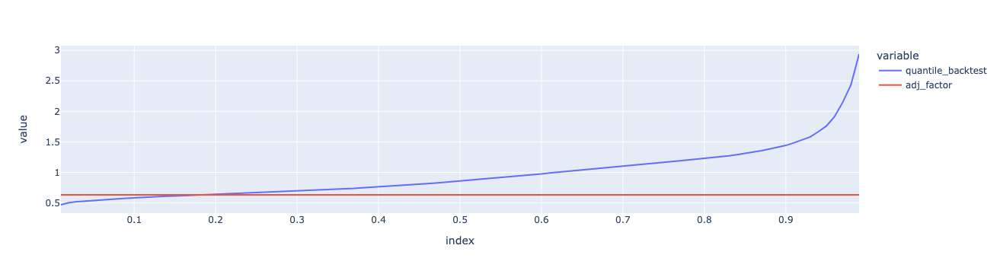

In [73]:
px.line(
    adj_factor_hist.quantile_backtest.quantile(
        [round(i,2) for i in np.linspace(0.01,.99,99)]
    ).to_frame().assign(adj_factor = model_obj.adj_factor)
)

/var/folders/5p/b_k1m3qs09q0s_768gjrmvvh0000gp/T/ipykernel_851/2637107794.py:1: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



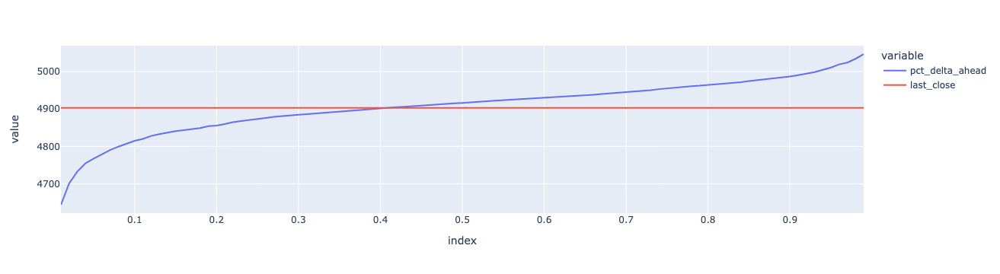

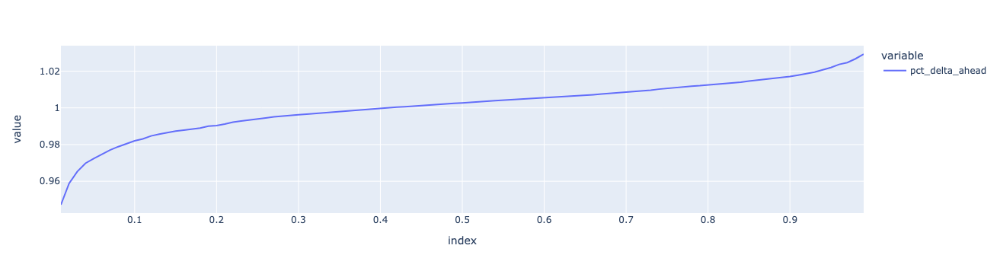

In [74]:
px.line(floating_quintile.add(1).multiply(data.Close[-1]).to_frame().assign(last_close = data.Close[-1])).show()
px.line(floating_quintile.add(1).to_frame()).show()

# Trade menu

In [77]:
%%time
max_combos = 30_000

bounds = tuple(round(i) for i in floating_quintile.agg(['min','max']).add(1).multiply(data.Close[-1]))
print(bounds)

menu = menus.TradeMenu(
    prices_df,
    data.Close[-1],
    floating_quintile,
    bounds = bounds,
    midpoint_price = True
)

menu.iron_condors(
        downsample = max_combos,
        win_pct_bounds = (0.6,0.99)
)

<timed exec>:3: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

<timed exec>:8: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



(4644, 5047)
712,429 combinations detected, randomly downsampling to 30,000 combinations
Calculating 30000 Iron Condors...


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 430 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 780 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 1230 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 1780 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 2430 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 3180 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 4030 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done 4980 tasks      | elapsed:   13.8s
[Parallel(n_jobs=-1)]: Done 6030 tasks      | elapsed:   16.6s
[Parallel(n_jobs=-1)]: Done 7180 tasks      | elapsed:   19.7s
[Parallel(n_jobs=-1)]: Done 8430 tasks      | elapsed:   23.1s
[Parallel(n_jobs=-1)]: Done 9780 tasks      | elapsed:   26.9s
[Parallel(n_jobs=-1)]: Done 11230 tasks 

Transforming output
CPU times: user 1min 26s, sys: 2.54 s, total: 1min 28s
Wall time: 1min 27s


In [78]:
menu.menu.sort_values('EV_harmonic',ascending =False)\
    .loc[
    menu.menu.EV_harmonic.gt(1)
    # & menu.menu.win_pct.gt(.75)
].head(50)# menu.menu.cost.lt(0) &

cost  EV_arithmetic   win_pct  \
strategy    leg_1  leg_2  leg_3  leg_4                                    
Iron condor 4865.0 4905.0 4965.0 5040.0 -22.33     458.624770  0.616162   
                   4900.0 4970.0 5015.0 -17.93     368.507353  0.626263   
                   4910.0 4960.0 5030.0 -25.55     472.383650  0.606061   
                   4905.0 4965.0 5015.0 -21.23     405.907368  0.606061   
            4855.0 4905.0 4965.0 5040.0 -24.83     501.419569  0.636364   
            4870.0 4905.0 4980.0 5030.0 -17.80     365.726712  0.616162   
            4860.0 4905.0 4975.0 5040.0 -21.63     448.398765  0.636364   
                   4900.0 4960.0 5035.0 -22.30     454.484412  0.626263   
            4870.0 4900.0 4980.0 5025.0 -15.25     323.729309  0.626263   
            4865.0 4900.0 4965.0 5000.0 -17.75     336.326114  0.606061   
                          4985.0 5030.0 -16.20     350.316158  0.646465   
                   4895.0 4970.0 5030.0 -16.45     363.220044  0.636364   
            4870.0 4900.0 4965.0 5035.0 -18.45     391.836706  0.606061   
            4860.0 4905.0 4970.0 5020.0 -21.80     427.056282  0.626263   
                   4915.0 4965.0 5035.0 -28.40     508.932651  0.606061   
            4865.0 4890.0 4970.0 5000.0 -12.50     258.962800  0.626263   
            4875.0 4905.0 4975.0 5035.0 -17.15     348.798670  0.606061   
            4865.0 4900.0 4975.0 5015.0 -16.93     345.007509  0.626263   
                          4980.0 5025.0 -16.65     350.469465  0.636364   
            4870.0 4880.0 4980.0 4995.0  -5.20     120.163110  0.646465   
            4875.0 4900.0 4970.0 5030.0 -15.70     339.216429  0.606061   
            4870.0 4890.0 4980.0 5005.0  -9.75     210.692735  0.636364   
            4860.0 4920.0 4965.0 5040.0 -31.23     531.246885  0.606061   
            4865.0 4900.0 4955.0 5030.0 -22.10     431.909507  0.606061   
                   4895.0 4965.0 5010.0 -16.33     325.395269  0.626263   
            4860.0 4915.0 4960.0 5020.0 -28.90     489.371929  0.606061   
                   4885.0 4985.0 5030.0 -11.40     279.922341  0.676768   
            4855.0 4910.0 4950.0 5015.0 -29.88     494.202866  0.606061   
            4845.0 4925.0 4940.0 5040.0 -44.28     637.301288  0.626263   
            4875.0 4910.0 4980.0 5035.0 -18.75     355.735318  0.606061   
            4850.0 4905.0 4945.0 5030.0 -30.85     533.974755  0.606061   
            4690.0 4720.0 4720.0 4745.0 -25.15      26.029893  0.989899   
            4855.0 4905.0 4970.0 5025.0 -23.25     457.285810  0.636364   
            4860.0 4890.0 4985.0 5030.0 -13.25     306.829886  0.666667   
            4855.0 4915.0 4950.0 5020.0 -32.70     521.399939  0.606061   
            4860.0 4905.0 4980.0 5030.0 -20.50     416.042309  0.646465   
            4855.0 4890.0 4980.0 5040.0 -15.48     360.034708  0.676768   
            4850.0 4905.0 4970.0 5030.0 -24.60     490.403754  0.656566   
            4855.0 4925.0 4950.0 5035.0 -38.90     580.028527  0.606061   
                   4915.0 4960.0 5025.0 -30.35     519.601457  0.606061   
            4865.0 4885.0 4985.0 5020.0  -9.60     230.437740  0.676768   
            4860.0 4890.0 4970.0 5020.0 -15.25     332.896156  0.646465   
            4845.0 4905.0 4955.0 5035.0 -29.15     539.520511  0.636364   
            4860.0 4890.0 4965.0 5005.0 -15.25     308.233066  0.626263   
            4855.0 4905.0 4970.0 5020.0 -23.00     446.275640  0.636364   
            4850.0 4915.0 4960.0 5030.0 -31.70     552.719401  0.626263   
            4865.0 4895.0 4965.0 4995.0 -15.00     280.943936  0.606061   
            4850.0 4900.0 4955.0 5015.0 -24.93     459.139026  0.626263   
            4860.0 4880.0 4985.0 5015.0  -8.88     214.219885  0.676768   
            4850.0 4910.0 4960.0 5025.0 -28.90     518.498413  0.636364   

                                         max_loss  EV_harmonic  kelly  
strategy    leg_1  leg_2  leg_3  leg_4                               

## Visualization

### Iron Condors

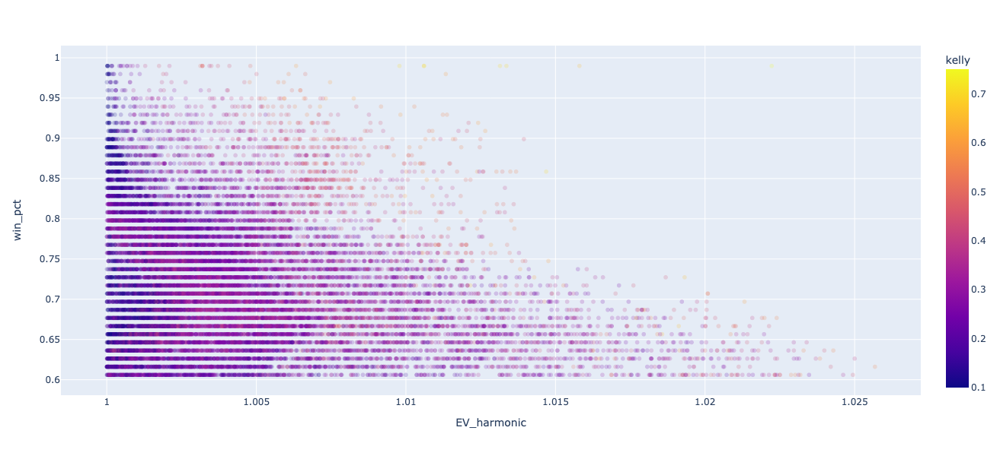

In [79]:
px.scatter(
    data_frame = menu.menu.loc['Iron condor'].reset_index(),#.sample(30000),
    x = 'EV_harmonic',
    y = 'win_pct',
    hover_data = ['leg_1','leg_2','leg_3','leg_4'],
    opacity = 0.2,
    height = 600,
    color = 'kelly'
)

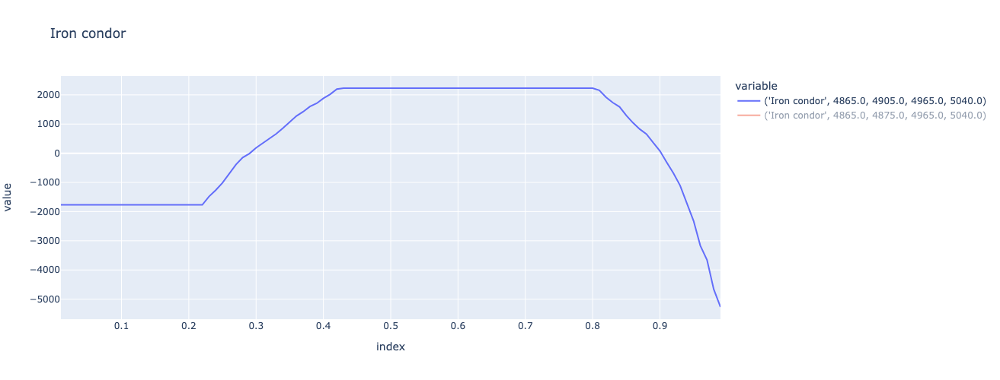

In [86]:
strategy = 'Iron condor'
val1, val2, val3, val4 =4865,4905,4965,5040
menu_slice = menu.quantiles.loc[pd.IndexSlice[strategy,val1,:,val3,val4],:].T

menu_slice.columns = [str(i) for i in menu_slice.columns.to_flat_index()]

px.line(menu_slice,height = 500,title = strategy)

In [88]:
menu.menu.loc[pd.IndexSlice[strategy,val1,val2,val3,val4],:]

cost              -22.330000
EV_arithmetic     458.624770
win_pct             0.616162
max_loss        -5269.600000
EV_harmonic         1.025679
kelly               0.550000
Name: (Iron condor, 4865.0, 4905.0, 4965.0, 5040.0), dtype: float64

In [40]:
opt = options.OptionChain([
    options.Option.buy_put(466,2.11,data.Close[-1],floating_quintile),
    options.Option.write_put(467.5,2.71,data.Close[-1],floating_quintile),
    options.Option.write_call(474,0.72,data.Close[-1],floating_quintile),
    options.Option.buy_call(482,0.06,data.Close[-1],floating_quintile),
])

In [38]:
contracts = 40

print(
    'EV:',opt.payout.sum()*100*contracts,
    '\nMax loss:',opt.payout.min()*1_000*contracts,
    '\nwin %:', opt.payout.gt(0).mean(),
    '\nE(win):', opt.payout[opt.payout.gt(0)].mean()*100,
    '\nE(loss):', opt.payout[opt.payout.lt(0)].mean()*100
)

NameError: name 'opt' is not defined

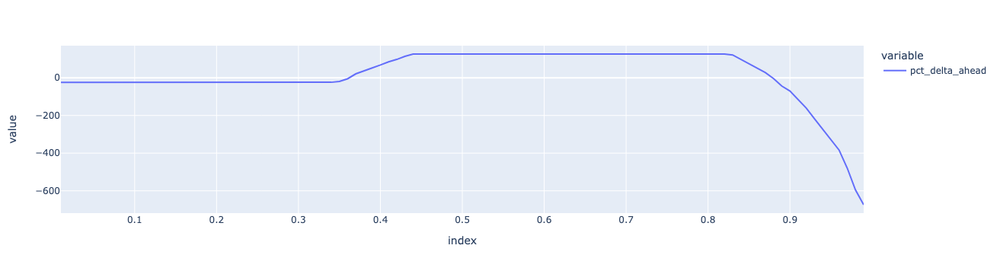

In [48]:
px.line(opt.payout*10000)

# Kelly Criterion

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:    5.6s finished


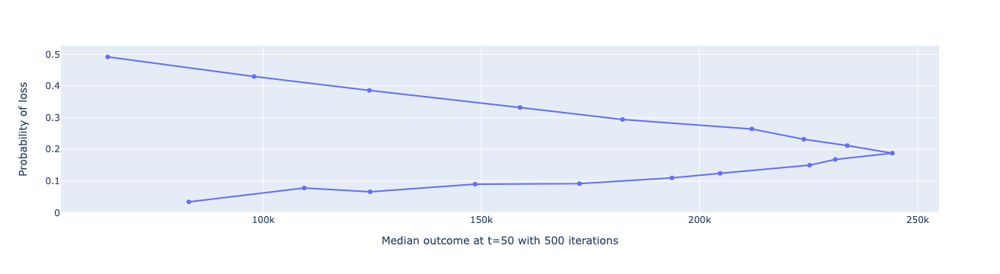

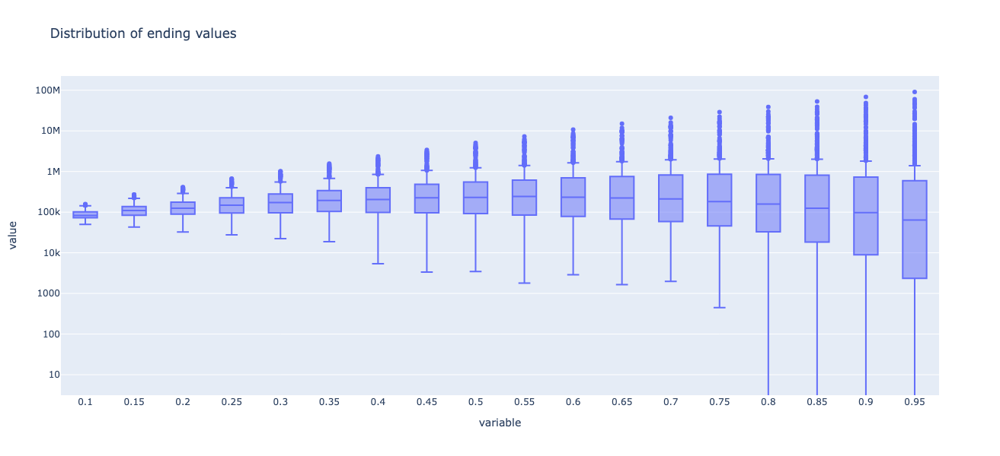

       Contracts  Max_loss  Max_gain
Kelly                               
0.10         1.0   -5269.6    2230.4
0.15         1.0   -5269.6    2230.4
0.20         2.0  -10539.2    4460.8
0.25         2.0  -10539.2    4460.8
0.30         3.0  -15808.8    6691.2
0.35         3.0  -15808.8    6691.2
0.40         4.0  -21078.4    8921.6
0.45         5.0  -26348.0   11152.0
0.50         5.0  -26348.0   11152.0
0.55         6.0  -31617.6   13382.4
0.60         6.0  -31617.6   13382.4
0.65         7.0  -36887.2   15612.8
0.70         7.0  -36887.2   15612.8
0.75         8.0  -42156.8   17843.2
0.80         9.0  -47426.4   20073.6
0.85         9.0  -47426.4   20073.6
0.90        10.0  -52696.0   22304.0
0.95        10.0  -52696.0   22304.0


In [87]:
strategy = 'Iron condor'
val1, val2, val3, val4 =4865,4905,4965,5040

menu.kelly_criteria(strategy, val1, val2, val3, val4,iterations = 500)

# Addenda

,max,min
adj_factor_decile,,
1,0.671780,0.399561
2,0.828003,0.671803
3,1.008181,0.828101
4,1.213051,1.008193
5,8.425501,1.213142


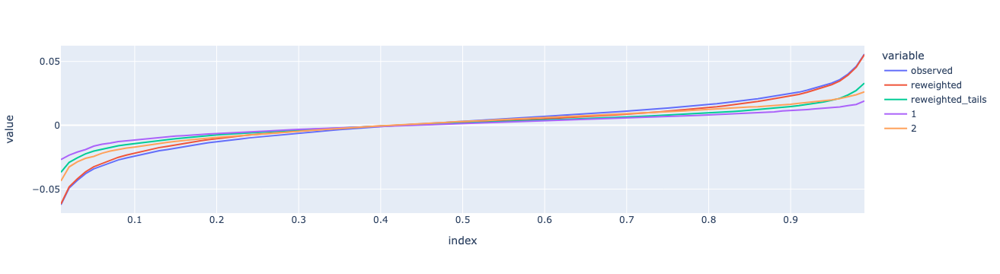

In [ ]:
adj_factor_hist = pd.read_csv('../horizon_5_adj_factor.csv')
adj_factor_hist.columns = ['Date','quantile_backtest']
adj_factor_hist = adj_factor_hist.assign(Date = lambda x: pd.to_datetime(x.Date)).set_index('Date')

adj_factor_hist = adj_factor_hist.join(model_obj.y)
adj_factor_hist = adj_factor_hist.assign(
    adj_factor_decile = lambda x: x.quantile_backtest
        .rank(pct = True).multiply(5).apply(np.floor).add(1).astype(int).replace({6:5})
)

adj_factor_bounds = adj_factor_hist.groupby('adj_factor_decile').quantile_backtest.agg(['max','min'])
display(adj_factor_bounds)

adj_factor_quintiles = adj_factor_hist.groupby(
    'adj_factor_decile'
).pct_delta_ahead.apply(
    lambda x: x.quantile([round(i,2) for i in np.linspace(0.01,.99,99)])
).unstack(0)

px.line(model_obj.quantiles.join(adj_factor_quintiles[[1,2]]),height = 500)

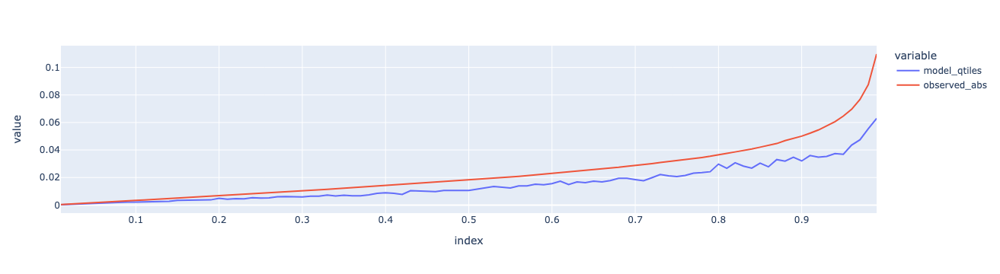

In [684]:
px.line(model_obj.model_qtiles)

### Comparison to VIX

In [56]:
adj_factor_hist = pd.read_csv('../horizon_5_adj_factor_v2.csv',index_col = 0, parse_dates = True)
adj_factor_hist = adj_factor_hist.join(
    model_obj.y.abs().rename(columns = {'pct_delta_ahead':'pct_delta_ahead_abs'})
).join(
    model_obj.X.VIX
).join(model_obj.y)

In [57]:
adj_factor_hist.loc['2022-01-01':].corr()

,adj_factor_5,pct_delta_ahead_abs,VIX,pct_delta_ahead
adj_factor_5,1.000000,0.300515,0.950312,0.065567
pct_delta_ahead_abs,0.300515,1.000000,0.311093,-0.131354
VIX,0.950312,0.311093,1.000000,0.033424
pct_delta_ahead,0.065567,-0.131354,0.033424,1.000000


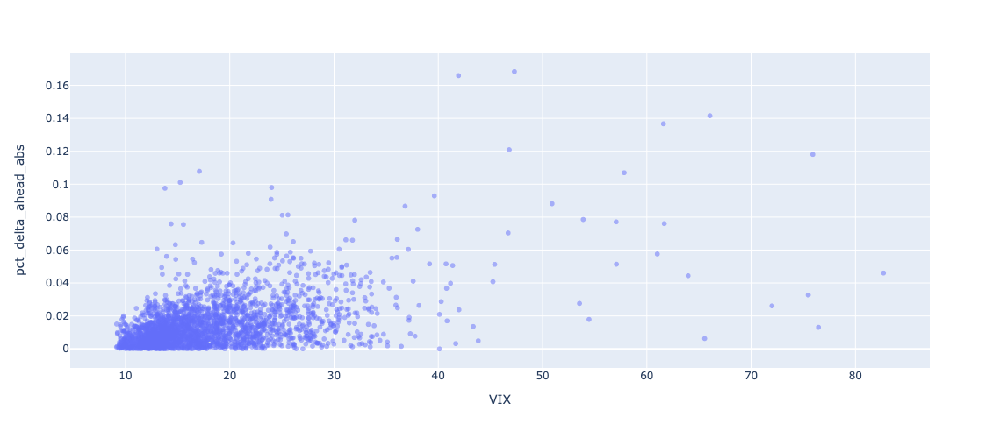

In [61]:
px.scatter(adj_factor_hist.loc['2013-01-01':],x = 'VIX',y = 'pct_delta_ahead_abs',height = 500,opacity = 0.5)

/Users/dwynne891/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



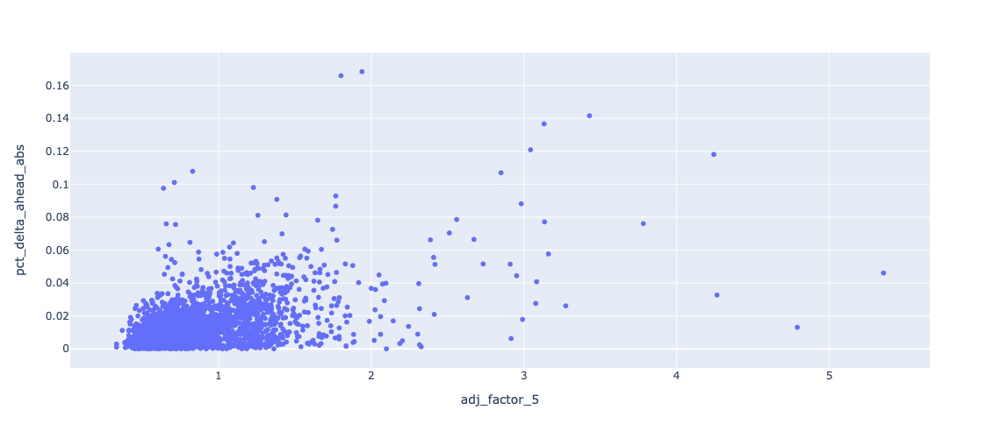

In [60]:
dt = '2013-01-01'

px.scatter(
    adj_factor_hist.loc[dt:],
    x = 'adj_factor_5',
    y = 'pct_delta_ahead_abs',
    hover_name=adj_factor_hist.loc[dt:].index,
    #opacity = 0.2,
    height = 500
)

divide by zero encountered in log


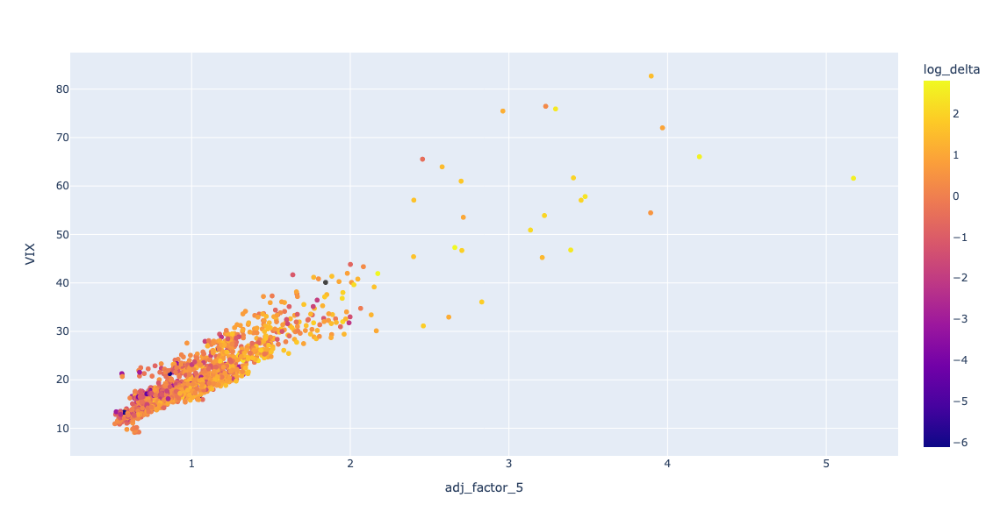

In [401]:
filter_dt = '2018-01-01'

px.scatter(
    adj_factor_hist.loc[filter_dt:].assign(log_delta = lambda x: np.log(x.pct_delta_ahead_abs*100)),
    x = 'adj_factor_5',
    y = 'VIX',
    color='log_delta',
    hover_name=adj_factor_hist.loc[filter_dt:].index,
#    opacity = 0.5
    height=600
)

### Low/high times within quintiles

In [498]:
temp = output_10.join(model_obj.y).assign(
    af_low_quintile = lambda x: x.adj_factor_10.where(x.adj_factor_10.lt(x.adj_factor_10.quantile(.2))),
    delta_low_quintile = lambda x: x.pct_delta_ahead.where(
        x.pct_delta_ahead.where(~x.af_low_quintile.isna()).lt(x.pct_delta_ahead.where(~x.af_low_quintile.isna()).quantile(.1))
    ),
    delta_hi_quintile = lambda x: x.pct_delta_ahead.where(
        x.pct_delta_ahead.where(~x.af_low_quintile.isna()).gt(x.pct_delta_ahead.where(~x.af_low_quintile.isna()).quantile(.9))
    ),
)

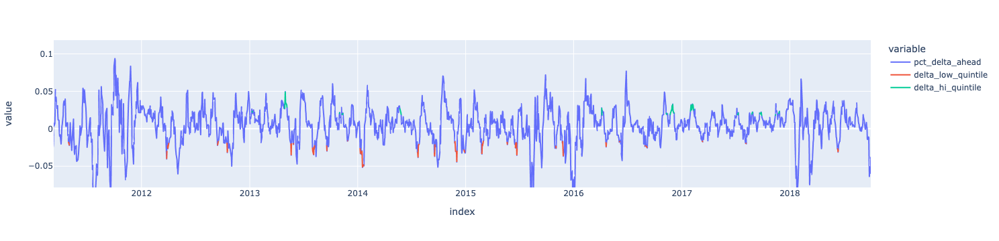

In [502]:
px.line(
    temp.filter(regex = 'delta')
)

In [500]:
temp

,adj_factor_10,pct_delta_ahead,af_low_quintile,delta_low_quintile,delta_hi_quintile
1994-07-05,0.989536,0.012905,NaN,NaN,NaN
1994-07-06,0.909043,0.009780,NaN,NaN,NaN
1994-07-07,0.829236,0.007652,NaN,NaN,NaN
1994-07-08,0.886934,0.009743,NaN,NaN,NaN
1994-07-11,1.049821,0.014665,NaN,NaN,NaN
...,...,...,...,...,...
2023-11-16,0.747421,0.019701,NaN,NaN,NaN
2023-11-17,0.682659,0.013088,NaN,NaN,NaN
2023-11-20,0.646113,0.005151,0.646113,NaN,NaN
2023-11-21,0.714054,0.003287,NaN,NaN,NaN


### Price target

In [124]:
mod = GradientBoostingRegressor(loss = 'huber')#(loss = 'quantile',alpha = 50/100)

In [141]:
mod.fit(
    model_obj.X,
    model_obj.data.pct_delta_ahead[model_obj.X.index]*100
)

GradientBoostingRegressor(loss='huber')

In [134]:
import shap

In [142]:
explainer = shap.Explainer(mod.predict, model_obj.X.sample(100))
shap_values = explainer(model_obj.X)
shap_values_sample = explainer(model_obj.data.loc['2023-12-15',model_obj.X.columns])

PermutationExplainer explainer: 7408it [04:22, 27.16it/s]                          


In [159]:
model_obj.data.loc['2023-12-11':'2023-12-15',model_obj.X.columns].fillna(0)

,Volume,Volume_7d,pct_delta_1d,pct_delta_2d,pct_delta_3d,pct_delta_4d,pct_delta_5d,pct_delta_6d,pct_delta_7d,pct_delta_30d,pct_delta_60d,pct_delta_90d,pct_delta_180d,pct_delta_360d,hv30,shiller_pe,T10Y2Y,VIX,jobs_friday
Date,,,,,,,,,,,,,,,,,,,
2023-12-11,65002200,7.364650e+07,0.003890,0.008205,0.015898,0.011805,0.011605,0.006295,0.012248,0.124939,0.041997,0.029298,0.167378,0.187665,0.431437,30.97,-0.48,12.63,0.0
2023-12-12,68327600,7.067931e+07,0.004567,0.008475,0.012810,0.020538,0.016426,0.016225,0.010891,0.116726,0.046142,0.038697,0.170521,0.194072,0.408854,30.97,-0.53,12.07,0.0
2023-12-13,93278000,7.365747e+07,0.013790,0.018420,0.022382,0.026777,0.034612,0.030442,0.030239,0.125060,0.062772,0.043909,0.189333,0.224527,0.440984,30.97,-0.42,12.19,0.0
2023-12-14,119026000,8.069069e+07,0.003209,0.017044,0.021689,0.025663,0.030072,0.037932,0.033749,0.116761,0.076076,0.051833,0.176056,0.239424,0.425021,30.97,-0.45,12.48,0.0
2023-12-15,141319300,9.100420e+07,-0.005678,-0.002487,0.011269,0.015888,0.019839,0.024224,0.032039,0.089539,0.087948,0.052900,0.162571,0.238893,0.365930,31.92,-0.53,12.28,0.0


In [160]:
shap_values_sample = explainer(model_obj.data.loc['2023-12-11':'2023-12-15',model_obj.X.columns].fillna(0))

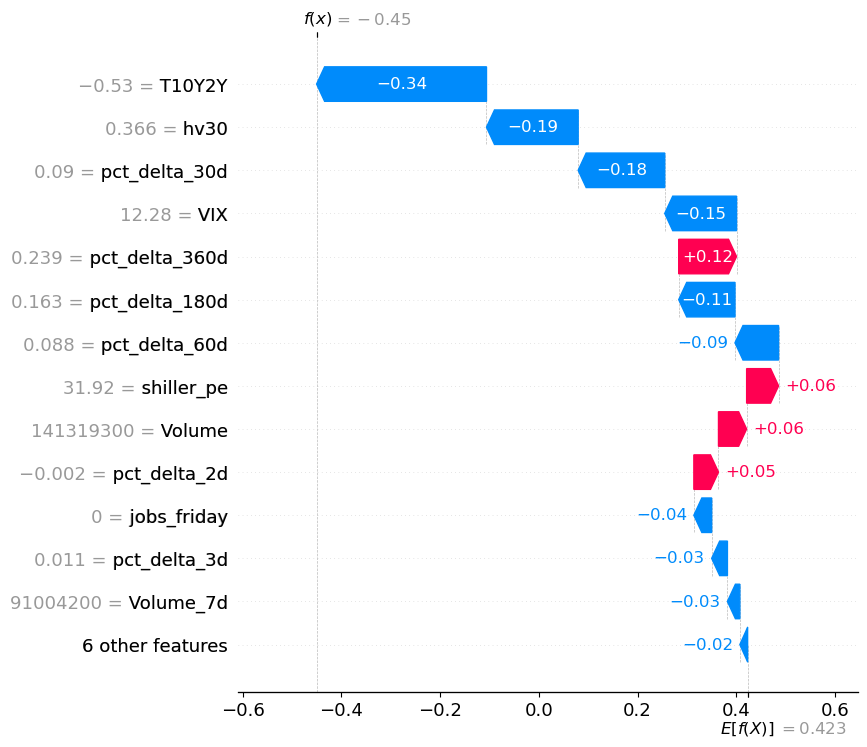

In [163]:
shap.plots.waterfall(shap_values_sample[-1], max_display=14)

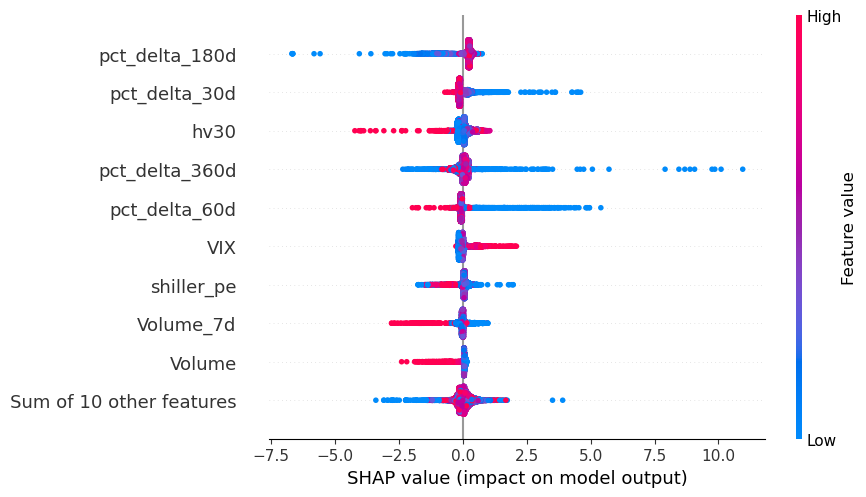

In [166]:
shap.plots.beeswarm(shap_values)

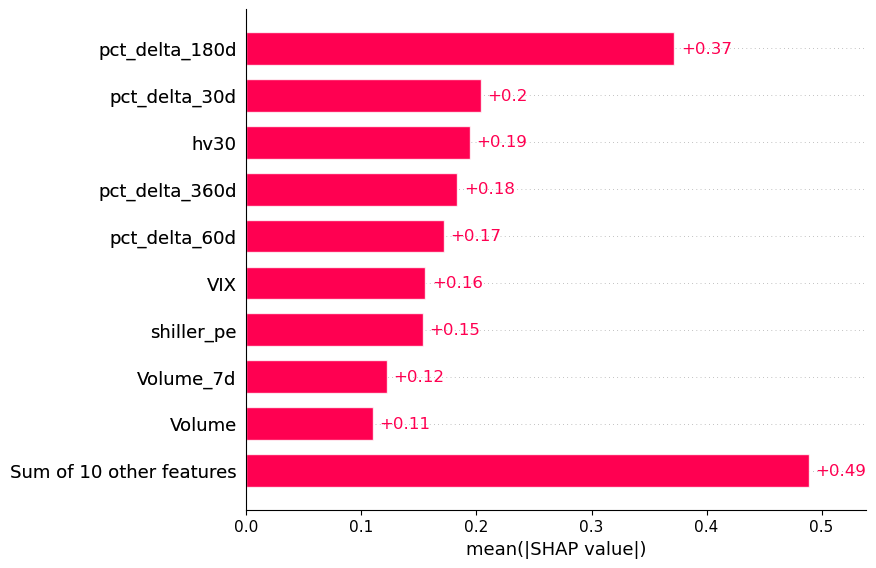

In [167]:
shap.plots.bar(shap_values)

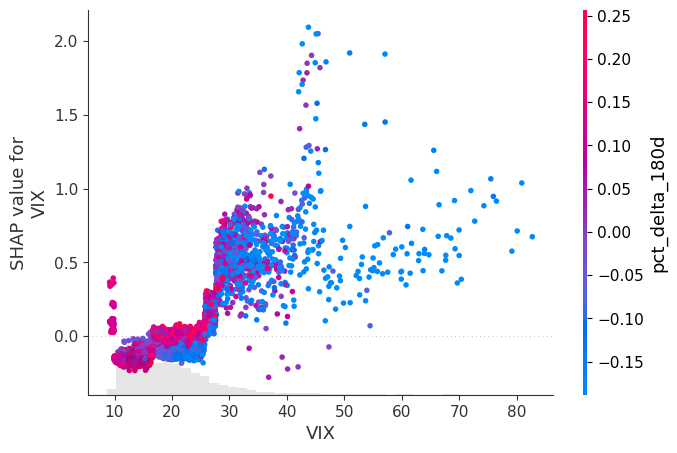

In [168]:
shap.plots.scatter(shap_values[:, "VIX"], color=shap_values)


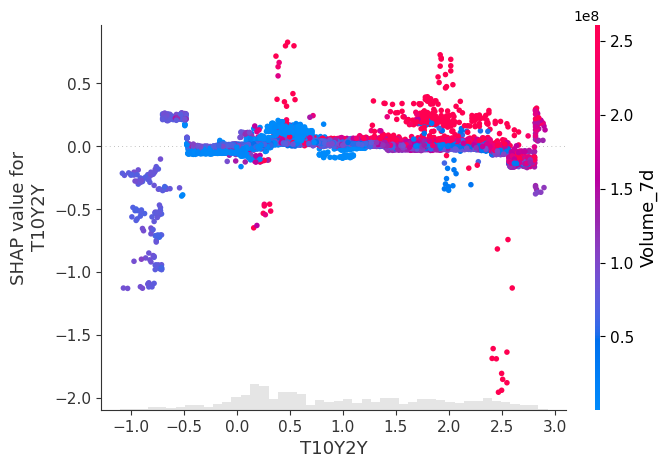

In [169]:
shap.plots.scatter(shap_values[:, "T10Y2Y"], color=shap_values)


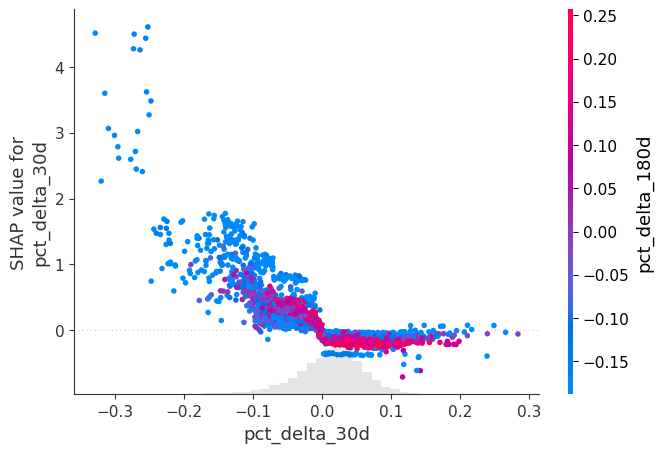

In [170]:
shap.plots.scatter(shap_values[:, "pct_delta_30d"], color=shap_values)


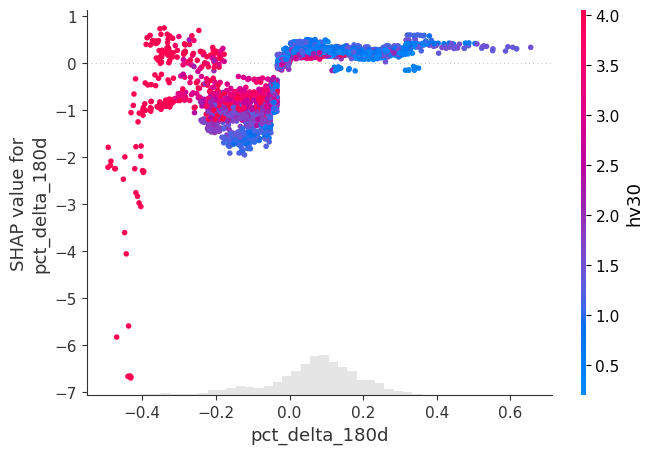

In [171]:
shap.plots.scatter(shap_values[:, "pct_delta_180d"], color=shap_values)


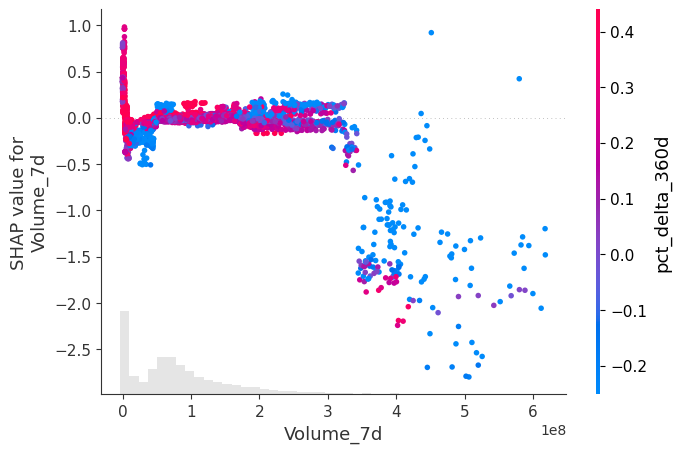

In [174]:
shap.plots.scatter(shap_values[:, "Volume_7d"], color=shap_values)


### Dad's funds

In [253]:
from datetime import date

In [259]:
risk_ticker = 'SPY'
end_ts = int(pd.to_datetime(date.today()+pd.Timedelta(1,unit = 'd')).timestamp())
data_price_raw = pd.read_csv(f'https://query1.finance.yahoo.com/v7/finance/download/{risk_ticker}?period1=728265600&period2={end_ts}&interval=1d&events=history&includeAdjustedClose=true')
data_price_raw = data_price_raw.set_index('Date').rename(columns={'Close':risk_ticker})[[risk_ticker]]



In [268]:
risk_ticker = 'VWUSX'
end_ts = int(pd.to_datetime(date.today()+pd.Timedelta(1,unit = 'd')).timestamp())
data_price_stock = pd.read_csv(f'https://query1.finance.yahoo.com/v7/finance/download/{risk_ticker}?period1=728265600&period2={end_ts}&interval=1d&events=history&includeAdjustedClose=true')
data_price_stock = data_price_stock.set_index('Date').rename(columns={'Close':risk_ticker})[[risk_ticker]]
data_price_raw = data_price_raw.join(data_price_stock)
data_price_raw

,SPY,AAPL,NKTR,EXTR,VASVX,VIGAX,VSTCX,VWUSX
Date,,,,,,,,
1993-01-29,43.937500,0.531250,NaN,NaN,NaN,NaN,NaN,15.280000
1993-02-01,44.250000,0.546875,NaN,NaN,NaN,NaN,NaN,15.340000
1993-02-02,44.343750,0.537946,NaN,NaN,NaN,NaN,NaN,15.320000
1993-02-03,44.812500,0.535714,NaN,NaN,NaN,NaN,NaN,15.460000
1993-02-04,45.000000,0.531250,NaN,NaN,NaN,NaN,NaN,15.530000
...,...,...,...,...,...,...,...,...
2023-12-29,475.309998,192.529999,0.56,17.639999,28.900000,160.000000,37.419998,56.630001
2024-01-02,472.649994,185.639999,0.59,17.809999,28.790001,157.220001,37.209999,55.509998
2024-01-03,468.790009,184.250000,0.56,17.379999,28.250000,155.720001,36.290001,54.790001


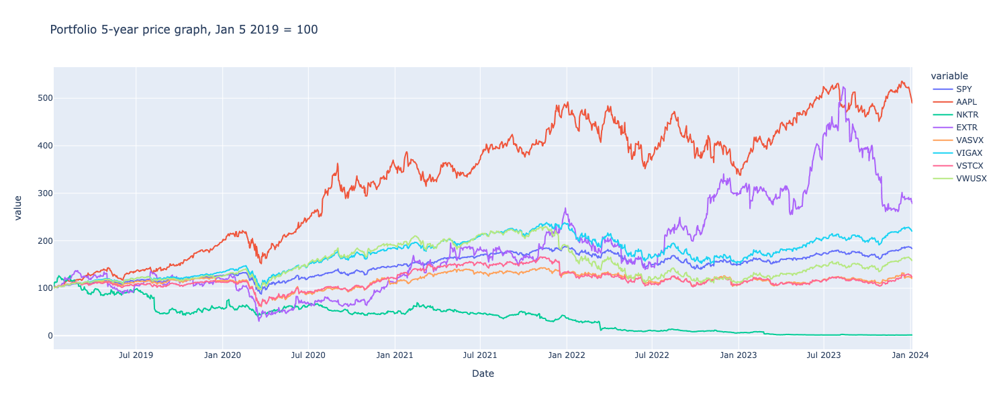

In [310]:
px.line(
    data_price_raw.loc['2019-01-05':].apply(lambda x: x/x[0]*100),
    height = 600,
    title = 'Portfolio 5-year price graph, Jan 5 2019 = 100'
)

In [292]:
data_price_raw.loc['2019-01-05':].apply(lambda x: x/x[0]*100-100).iloc[-1]

SPY       83.945280
AAPL     389.907396
NKTR     -98.525396
EXTR     178.084399
VASVX     21.608895
VIGAX    120.400627
VSTCX     24.229980
VWUSX     58.937904
Name: 2024-01-05, dtype: float64

In [275]:
yield_exp = {'VSTCX':[1.15,0.26],
 'VWUSX':[0.28, 0.30],
 'VIGAX':[0.57, 0.05],
 'VASVX':[1.6, 0.38],
 'EXTR':[0,0],
 'NKTR':[0,0],
 'AAPL':[0.53,0],
 'SPY':[1.4,0.09]
}

In [305]:
yield_df = pd.DataFrame.from_dict(
    yield_exp,
    columns = ['Yield %','Expense Ratio %'],
    orient = 'index'
).join(data_price_raw.loc['2019-01-05':].apply(lambda x: round(x/x[0]*100-100)).iloc[-1].rename('5-year return %'))

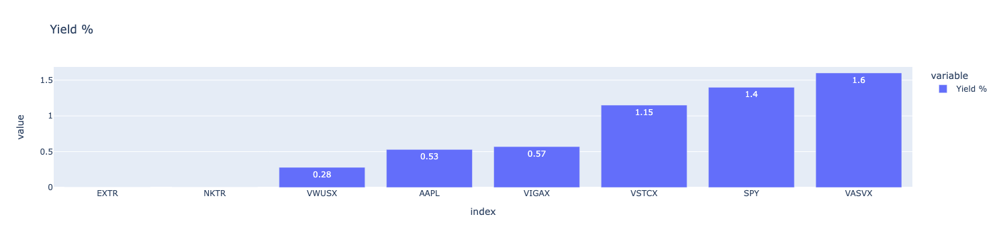

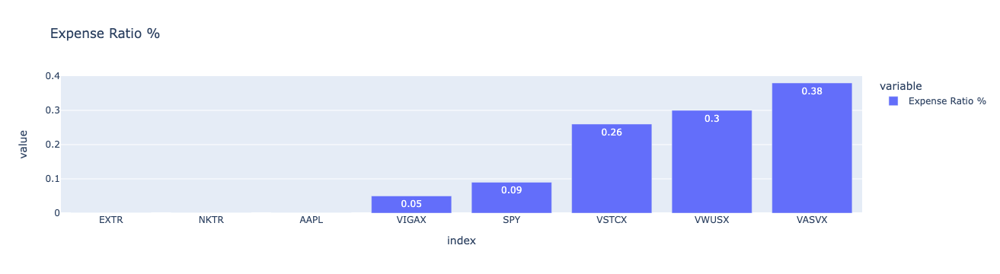

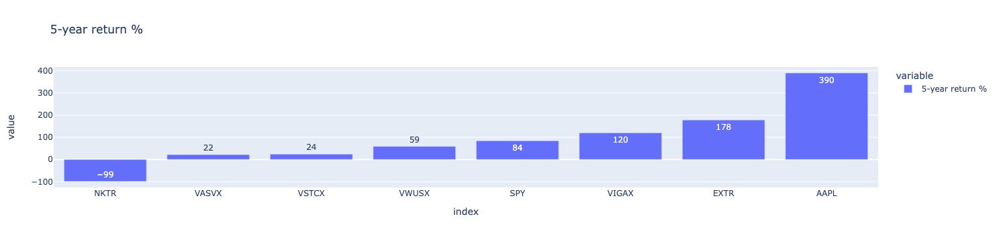

In [306]:
var = 'Yield %'
px.bar(yield_df.sort_values(var)[var], title = var, text_auto=True).show()

var = 'Expense Ratio %'
px.bar(yield_df.sort_values(var)[var], title = var, text_auto=True).show()

var = '5-year return %'
px.bar(yield_df.sort_values(var)[var], title = var, text_auto=True).show()

## Maker menu

In [514]:
horizon = 22
temp = data.Close.pct_change().add(1).to_frame().assign(t_0 = 1)

temp = pd.concat([
    temp.Close.shift(-i).rename(f't_{i}') for i in range(1,horizon+1)
],axis = 1).dropna().cumprod(1)

In [515]:
adj_factor_bounds

,max,min
adj_factor_decile,,
1,0.661213,0.330854
2,0.830924,0.661253
3,1.008487,0.830972
4,1.230522,1.008491
5,4.104313,1.230721


In [558]:
quintile = 2

af_filter = adj_factor_hist[adj_factor_hist.quantile_backtest.between(
    adj_factor_bounds.loc[quintile,'min'],
    adj_factor_bounds.loc[quintile,'max']
)].index

In [517]:
temp = temp.loc[af_filter]

In [518]:
temp_qtile = pd.concat([
    temp.quantile(n/100) for n in range(5,100,5)
],axis = 1)

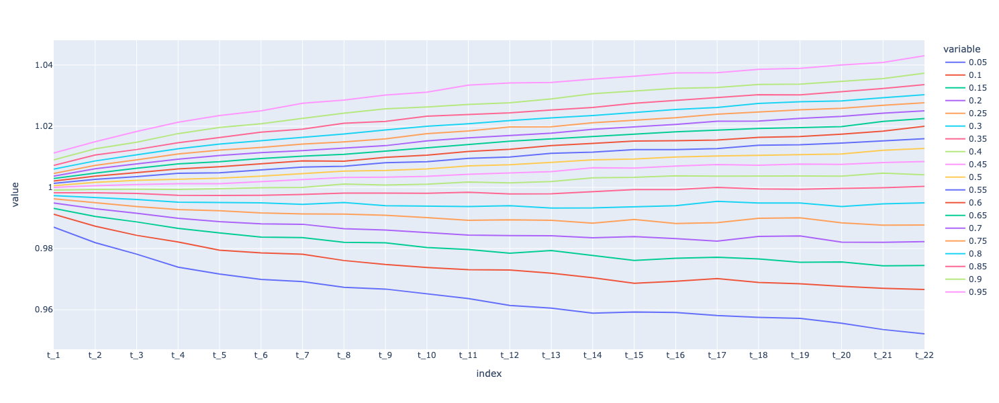

In [519]:
px.line(temp_qtile,height = 600)

In [552]:
temp.gt(1.01).cumsum(1).gt(0).mean()

t_1     0.077131
t_2     0.184032
t_3     0.269959
t_4     0.352503
t_5     0.418133
t_6     0.470230
t_7     0.523004
t_8     0.560893
t_9     0.592693
t_10    0.629905
t_11    0.656969
t_12    0.677267
t_13    0.697564
t_14    0.715832
t_15    0.729364
t_16    0.744249
t_17    0.755074
t_18    0.765900
t_19    0.774019
t_20    0.778755
t_21    0.787551
t_22    0.793640
dtype: float64

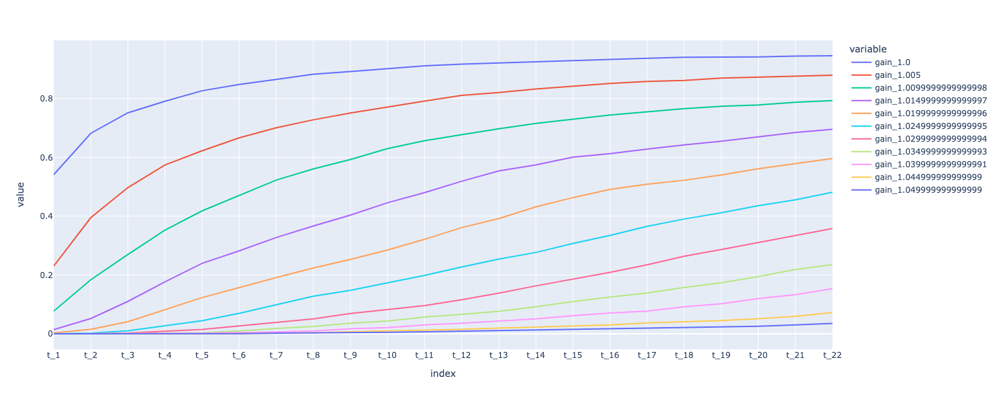

In [521]:
px.line(pd.concat([
    temp.gt(i).cumsum(1).gt(0).mean().rename(f'gain_{i}') for i in np.arange(1,1.05,0.005)
],axis = 1),height = 600)

### Black Scholes

S : current asset price

K: strike price of the option

r: risk free rate 

T : time until option expiration 

σ: annualized volatility of the asset's returns 

risk-free rate historical: https://fred.stlouisfed.org/graph/fredgraph.csv?bgcolor=%23e1e9f0&chart_type=line&drp=0&fo=open%20sans&graph_bgcolor=%23ffffff&height=450&mode=fred&recession_bars=on&txtcolor=%23444444&ts=12&tts=12&width=1138&nt=0&thu=0&trc=0&show_legend=yes&show_axis_titles=yes&show_tooltip=yes&id=DGS1MO&scale=left&cosd=2001-07-31&coed=2023-11-30&line_color=%234572a7&link_values=false&line_style=solid&mark_type=none&mw=3&lw=2&ost=-99999&oet=99999&mma=0&fml=a&fq=Daily&fam=avg&fgst=lin&fgsnd=2020-02-01&line_index=1&transformation=lin&vintage_date=2023-12-02&revision_date=2023-12-02&nd=2001-07-31

In [77]:
def BlackScholes(option_type,S,K,T,r,sigma):
    N = norm.cdf
    d1 = (np.log(S/K) + (r + sigma**2/2)*T) / (sigma*np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    if option_type == 'call':
        return S * N(d1) - K * np.exp(-r*T)* N(d2)
    elif option_type == 'put':
        return K*np.exp(-r*T)*N(-d2) - S*N(-d1)
    else:
        print('Unrecognized option type')

In [613]:
BlackScholes(
    'call',
    S = data.Close[-1],
    K = 475,
    T = 20/365,
    r = 0.0554,
    sigma = 0.0974
)

3.569497552526343

In [614]:
prices_df.loc[('C',475)]

Contract Name            SPY240112C00475000
Last Trade Date       2023-12-14 4:14PM EST
Last Price                             3.84
Bid                                    3.79
Ask                                    3.83
Change                                 0.28
% Change                             +7.87%
Volume                                 4578
Open Interest                          2432
Implied Volatility                    9.74%
Name: (C, 475.0), dtype: object

In [619]:
strike = 475
price = 3.83
risk_free = 0.0554
vol = 0.0974
time = 20
targets = [round(i,2) for i in np.arange(1.2,5.2,0.2)]
quintile = 2

temp = data.Close.pct_change().add(1).to_frame().assign(t_0 = 1)
temp = pd.concat([
    temp.Close.shift(-i).rename(f't_{i}') for i in range(1,time+1)
],axis = 1).dropna().cumprod(1)

af_filter = adj_factor_hist[adj_factor_hist.quantile_backtest.between(
    adj_factor_bounds.loc[quintile,'min'],
    adj_factor_bounds.loc[quintile,'max']
)].index

temp = temp.loc[af_filter]

bs_ex = temp.copy()
bs_ex.columns = [i for i in range(time,0,-1)]
bs_ex = bs_ex.multiply(data.Close[-1])

bs_ex = bs_ex.apply(
    lambda x: BlackScholes(
        'call',
        S = x,
        K = strike,
        T = (x.name-1)/365,
        r = risk_free,
        sigma = vol
    )
).div(price)

bs_ex.columns = temp.columns

bs_ex_cum = pd.concat([
    bs_ex.gt(i).cumsum(1).gt(0).mean().rename(i) for i in targets
],axis = 1)
bs_ex_cum.columns.rename('Targets',inplace = True)

bs_ex_pv = bs_ex_cum.iloc[-1].to_frame()

bs_ex_pv = bs_ex_pv.reset_index().assign(
    target_miss_payout = [temp[bs_ex_pv.columns[0]].multiply(data.Close[-1]).add(-strike).apply(lambda x: np.maximum(x,0)).div(price)[
        ~bs_ex.gt(i).cumsum(1).gt(0)[bs_ex_pv.columns[0]]
    ].mean()-1 for i in targets],
    EV = lambda x: x[bs_ex_pv.columns[0]]*(x.Targets-1)+(1-x[bs_ex_pv.columns[0]])*x.target_miss_payout
).set_index('Targets')

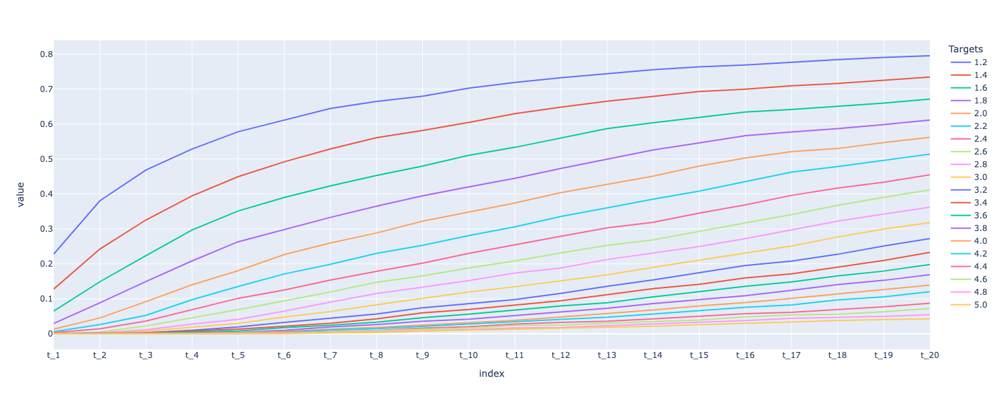

In [620]:
px.line(bs_ex_cum,height = 600)

In [623]:
bs_ex_pv

,t_20,target_miss_payout,EV
Targets,,,
1.2,0.794993,-0.929385,-0.031532
1.4,0.734100,-0.907686,0.052287
1.6,0.671177,-0.874472,0.115160
1.8,0.610961,-0.821485,0.169179
2.0,0.561570,-0.789318,0.215509
2.2,0.513532,-0.726442,0.262847
2.4,0.454668,-0.637215,0.289042
2.6,0.411367,-0.574988,0.319730
2.8,0.361976,-0.481196,0.344541


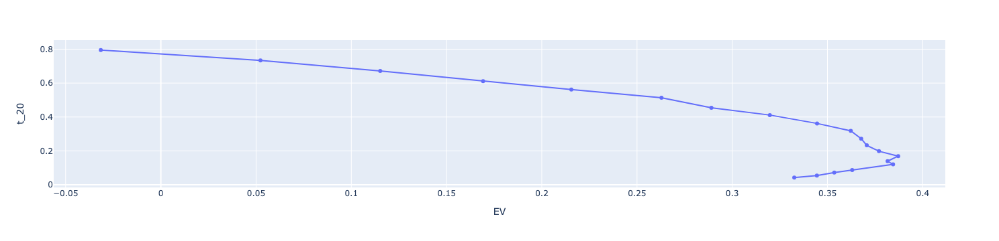

In [631]:
px.line(
    bs_ex_pv,
    y = 't_20',
    x = 'EV',
    markers = True,
    hover_name=bs_ex_pv.index
)

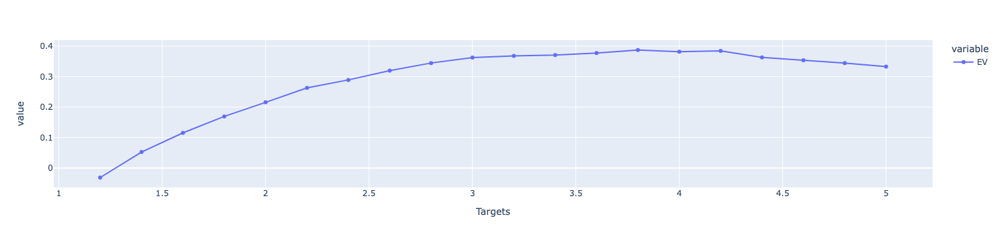

In [621]:
px.line(bs_ex_pv.EV,markers=True)